## Prepare

In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('../src/')

In [2]:
from package.logger import setup
setup("INFO")

In [3]:
import os

import folium

from package import strtime
from package.h3 import (
    plot_h3_cells_on_folium,
)
from package.mcr5.labels import read_labels_for_nodes
from package.geometa import GeoMeta
from package.mcr.data import NetworkType, OSMData
import pandas as pd
from package.minute_city.profile import fill_columns_by_left

In [4]:
geo_meta_path = "../data/geometa.pkl"
city_id = "Koeln"
stops = "../data/cleaned/stops.csv"
structs = "../data/structs.pkl"

geo_meta = GeoMeta.load(geo_meta_path)
geo_data = OSMData(
	geo_meta,
	city_id,
	additional_network_types=[NetworkType.DRIVING],
)
nodes = geo_data.osm_nodes
edges = geo_data.osm_edges
driving_nodes, _, _ = geo_data.additional_networks[NetworkType.DRIVING]

[09:28:11] INFO     Using existing OSM data                                                              ]8;id=298442;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/osm/osm.py\osm.py]8;;\:]8;id=478377;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/osm/osm.py#106\106]8;;\

           INFO     Loading OSM network from cache (walking)                                              ]8;id=604786;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/osm/osm.py\osm.py]8;;\:]8;id=513543;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/osm/osm.py#69\69]8;;\

[09:29:14] INFO     Using existing OSM data                                                              ]8;id=382930;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/osm/osm.py\osm.py]8;;\:]8;id=171216;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/osm/osm.py#106\106]8;;\

           INFO     Loading OSM network from cache (driving)                                              ]8;id=637566;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/osm/osm.py\osm.py]8;;\:]8;id=782572;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/osm/osm.py#69\69]8;;\

## Fetch POIs

In [5]:
import matplotlib.pyplot as plt
from package.minute_city import minute_city

In [6]:
pois = minute_city.fetch_pois_for_area(geo_meta.boundary, nodes)
pois.head(3)

,name,id,lat,lon,geometry,type,nearest_osm_node_id,distance
0,Trink & Spare,263442909,51.0268777,6.8879464,POINT (6.88795 51.02688),grocery,9007727500,21.098025
1,Weinhaus Linke,444820559,50.9543812,6.9189388,POINT (6.91894 50.95438),grocery,3890235659,13.327476
2,O'Donnell Moonshine,448400534,50.9382394,6.9408967,POINT (6.94090 50.93824),grocery,6513219752,16.685454


## Visualize POIs

In [8]:
# def rgb2hex(rgb):
# 	return "#{:02x}{:02x}{:02x}".format(int(rgb[0] * 255), int(rgb[1] * 255), int(rgb[2] * 255))
# types = pois["type"].unique()

# types = ['grocery', 'education', 'health', 'banks', 'parks', 'sustenance', 'shops']

# # Get a colormap and create a color mapping
# colormap = plt.colormaps.get_cmap('tab10')
# color_mapping = {type_: rgb2hex(colormap(i)) for i, type_ in enumerate(types)}
# color_mapping

# bbox = nodes.unary_union.convex_hull.bounds

# m = folium.Map(location=[50.9375, 6.9603], zoom_start=12)
# geo_meta.add_to_folium_map(m)
# for _, poi in pois.iterrows():
# 	folium.CircleMarker(
# 		location=(poi.lat, poi.lon),
# 		popup=poi["name"],
# 		radius=1,
# 		color=color_mapping[poi["type"]]
# 	).add_to(m)

# m

## Calculate 15-minute-city metric

In [8]:
mcr5_output_path = "../data/mcr5/Koeln"

In [9]:
labels_per_scenario = {}
for entry in os.scandir(mcr5_output_path):
    if not entry.is_dir():
        continue

    labels = read_labels_for_nodes(
        entry.path, pois.nearest_osm_node_id.unique()
    )

    labels = minute_city.add_pois_to_labels(labels, pois)
    labels_per_scenario[entry.name] = labels


In [10]:
# from package.mcr5.labels import process_file

# labels = process_file(
#     "../data/mcr5/Koeln-debug/bicycle_1/891fa188c4fffff.feather",
#     pois.nearest_osm_node_id.unique(),
# )

# labels = labels.rename(
# 	columns={"osm_node_id": "target_id_osm", "hex_id": "start_id_hex"}
# )
# pois = minute_city.fetch_pois_for_area(geo_meta.boundary, nodes)
# poi_labels = minute_city.add_pois_to_labels(labels, pois)

In [11]:
types = list(pois["type"].unique())

In [12]:
profiles_df_per_scenario = {}
for scenario, labels in labels_per_scenario.items():
	profiles_df_per_scenario[scenario] = minute_city.get_profiles_df(labels, types)

[08:33:54] INFO     Grouping labels                                                               ]8;id=395058;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=301262;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.20 seconds)                                           ]8;id=844538;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=229102;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=107096;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=81394;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:34:00] INFO     Calculating profiles done (5.77 seconds)                                      ]8;id=853005;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=1668;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=771140;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=207522;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Creating profiles dataframe done (0.65 seconds)                               ]8;id=372469;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=149735;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=804873;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=408159;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.04 seconds)                                           ]8;id=808225;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=400523;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=432230;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=838932;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:34:04] INFO     Calculating profiles done (3.25 seconds)                                      ]8;id=667929;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=338012;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=925156;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=466060;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Creating profiles dataframe done (0.63 seconds)                               ]8;id=519114;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=146322;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=634352;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=44570;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.06 seconds)                                           ]8;id=745779;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=93449;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=231337;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=263629;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:34:10] INFO     Calculating profiles done (5.80 seconds)                                      ]8;id=564441;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=517819;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=272701;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=457582;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:34:11] INFO     Creating profiles dataframe done (0.67 seconds)                               ]8;id=7592;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=739217;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=362212;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=47587;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.04 seconds)                                           ]8;id=709268;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=897208;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=904260;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=656622;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:34:15] INFO     Calculating profiles done (4.41 seconds)                                      ]8;id=475555;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=736141;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=919447;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=992355;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:34:16] INFO     Creating profiles dataframe done (0.62 seconds)                               ]8;id=411322;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=151063;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=598261;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=149527;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.05 seconds)                                           ]8;id=464429;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=246214;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=787863;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=621295;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:34:21] INFO     Calculating profiles done (5.50 seconds)                                      ]8;id=16560;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=580647;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=727471;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=832793;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:34:22] INFO     Creating profiles dataframe done (0.65 seconds)                               ]8;id=980370;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=941781;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=944403;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=5332;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.07 seconds)                                           ]8;id=446260;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=725831;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=299033;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=812316;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:34:28] INFO     Calculating profiles done (6.39 seconds)                                      ]8;id=383190;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=504140;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=923288;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=192052;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:34:29] INFO     Creating profiles dataframe done (0.66 seconds)                               ]8;id=790634;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=459871;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=401411;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=326977;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.05 seconds)                                           ]8;id=257151;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=987324;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=223327;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=930265;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:34:35] INFO     Calculating profiles done (5.94 seconds)                                      ]8;id=306104;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=147587;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=390648;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=621255;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:34:36] INFO     Creating profiles dataframe done (0.66 seconds)                               ]8;id=452948;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=146501;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=393024;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=248401;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.08 seconds)                                           ]8;id=532127;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=927842;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=842731;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=723112;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:34:42] INFO     Calculating profiles done (6.47 seconds)                                      ]8;id=421976;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=654854;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=619062;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=822233;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:34:43] INFO     Creating profiles dataframe done (0.66 seconds)                               ]8;id=454721;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=489234;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=674769;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=385930;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.04 seconds)                                           ]8;id=693911;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=150142;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=739906;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=825770;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:34:47] INFO     Calculating profiles done (4.18 seconds)                                      ]8;id=159959;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=997902;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=921387;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=167429;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:34:48] INFO     Creating profiles dataframe done (0.64 seconds)                               ]8;id=180528;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=608496;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=932245;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=83555;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.05 seconds)                                           ]8;id=896599;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=385705;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=386265;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=792276;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:34:53] INFO     Calculating profiles done (5.40 seconds)                                      ]8;id=399742;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=466922;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=32471;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=733887;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:34:54] INFO     Creating profiles dataframe done (0.65 seconds)                               ]8;id=159151;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=135909;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=808075;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=501776;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.06 seconds)                                           ]8;id=374366;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=550411;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=855537;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=844423;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:35:01] INFO     Calculating profiles done (6.80 seconds)                                      ]8;id=714752;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=787170;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=382774;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=808452;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:35:02] INFO     Creating profiles dataframe done (0.65 seconds)                               ]8;id=121297;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=522670;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=406460;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=993689;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.08 seconds)                                           ]8;id=170315;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=590833;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=998553;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=227681;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:35:08] INFO     Calculating profiles done (6.62 seconds)                                      ]8;id=33065;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=229439;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=902023;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=574891;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:35:09] INFO     Creating profiles dataframe done (0.68 seconds)                               ]8;id=806185;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=580711;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=743496;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=364444;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.06 seconds)                                           ]8;id=208529;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=813801;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=518748;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=953525;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:35:15] INFO     Calculating profiles done (5.74 seconds)                                      ]8;id=807914;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=651857;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=646626;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=275383;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Creating profiles dataframe done (0.65 seconds)                               ]8;id=974150;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=409026;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=674223;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=674306;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.05 seconds)                                           ]8;id=936968;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=839630;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=545358;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=924118;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:35:20] INFO     Calculating profiles done (4.15 seconds)                                      ]8;id=443699;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=773951;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=229794;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=106605;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Creating profiles dataframe done (0.63 seconds)                               ]8;id=150887;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=897771;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=47157;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=489655;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.06 seconds)                                           ]8;id=654315;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=380572;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=379332;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=700097;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:35:26] INFO     Calculating profiles done (6.14 seconds)                                      ]8;id=51991;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=219293;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=143694;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=145268;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:35:27] INFO     Creating profiles dataframe done (0.65 seconds)                               ]8;id=174032;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=134034;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=106138;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=990110;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.05 seconds)                                           ]8;id=54992;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=915840;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=453085;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=66345;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:35:32] INFO     Calculating profiles done (5.21 seconds)                                      ]8;id=424554;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=626424;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=545916;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=267898;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:35:33] INFO     Creating profiles dataframe done (0.61 seconds)                               ]8;id=790029;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=331590;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=364644;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=14674;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.03 seconds)                                           ]8;id=57986;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=962791;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=900556;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=302724;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1750 [00:00<?, ?it/s]

[08:35:36] INFO     Calculating profiles done (3.00 seconds)                                      ]8;id=922074;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=661077;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=697616;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=413745;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:35:37] INFO     Creating profiles dataframe done (0.61 seconds)                               ]8;id=782458;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=826283;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=409073;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=313461;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.05 seconds)                                           ]8;id=29930;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=644295;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=758308;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=515214;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:35:41] INFO     Calculating profiles done (3.96 seconds)                                      ]8;id=446489;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=857489;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=284392;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=564725;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Creating profiles dataframe done (0.62 seconds)                               ]8;id=456015;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=227452;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=726454;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=106244;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.06 seconds)                                           ]8;id=223845;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=510327;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=110170;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=533707;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:35:47] INFO     Calculating profiles done (5.24 seconds)                                      ]8;id=788220;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=2815;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=355363;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=391721;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Creating profiles dataframe done (0.61 seconds)                               ]8;id=33249;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=650493;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=373495;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=357947;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.06 seconds)                                           ]8;id=313866;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=704917;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=382718;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=998253;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:35:53] INFO     Calculating profiles done (6.08 seconds)                                      ]8;id=343231;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=194990;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=56213;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=921562;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:35:54] INFO     Creating profiles dataframe done (0.66 seconds)                               ]8;id=501718;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=88916;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

           INFO     Grouping labels                                                               ]8;id=179120;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=372626;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Grouping labels done (0.06 seconds)                                           ]8;id=666359;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=773099;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#73\73]8;;\

           INFO     Calculating profiles                                                          ]8;id=252791;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=961534;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

  0%|          | 0/1782 [00:00<?, ?it/s]

[08:36:00] INFO     Calculating profiles done (6.40 seconds)                                      ]8;id=72623;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=793881;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#81\81]8;;\

           INFO     Creating profiles dataframe                                                   ]8;id=903633;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=496687;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

[08:36:01] INFO     Creating profiles dataframe done (0.65 seconds)                               ]8;id=66761;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py\minute_city.py]8;;\:]8;id=966453;file:///home/moritz/dev/uni/mcr-py/notebooks/../src/package/minute_city/minute_city.py#92\92]8;;\

In [25]:
for scenario, profiles_df in profiles_df_per_scenario.items():
	profiles_df["scenario"] = scenario


In [42]:
profiles_df = pd.concat(profiles_df_per_scenario.values())

In [43]:
profiles_df["required_cost_for_optimal_in_euro"] = (
    profiles_df["required_cost_for_optimal"] / 100
)
profiles_df["optimal_in_minutes"] = profiles_df["optimal"] / 60

In [63]:
profiles_df.columns
cost_columns = []
other_columns = []
for column in profiles_df.columns:
	if column.startswith("cost_"):
		cost_columns.append(column)
	else:
		other_columns.append(column)
cost_columns.sort(key=lambda x: int(x.split("_")[1]))
new_columns = other_columns + cost_columns

In [ ]:
profiles_df = profiles_df[new_columns]
profiles_df[cost_columns] = fill_columns_by_left(profiles_df[cost_columns])

In [49]:
def trim_trailing_numbers(string):
	has_trailing_numbers = string[-1].isdigit()
	if not has_trailing_numbers:
		return string
	return "_".join(string.split("_")[:-1])

In [50]:
profiles_df["core_scenario"] = profiles_df["scenario"].apply(trim_trailing_numbers)

In [53]:
profiles_df.to_feather("../data/mcr5/Koeln-profiles.feather")

In [9]:
profiles_df = pd.read_feather("../data/mcr5/Koeln-profiles.feather")

In [10]:
profiles_df_unaggregated = profiles_df.copy()

In [11]:
profiles_df = (
    profiles_df_unaggregated.drop(columns=["scenario"])
    .groupby(["core_scenario", "hex_id"])
    .mean()
    .reset_index(level=0)
    .rename(columns={"core_scenario": "scenario"})
)
profiles_df.head()

,scenario,any_column_different,required_cost_for_optimal,optimal,required_cost_for_optimal_in_euro,optimal_in_minutes,cost_0,cost_19,cost_38,cost_57,cost_76,cost_95,cost_100,cost_114,cost_133,cost_200,cost_220,cost_320,cost_420
hex_id,,,,,,,,,,,,,,,,,,,
891fa181003ffff,bicycle,0.0,0.0,720.0,0.0,12.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0
891fa181007ffff,bicycle,0.0,0.0,960.0,0.0,16.0,960.0,960.0,960.0,960.0,960.0,960.0,960.0,960.0,960.0,960.0,960.0,960.0,960.0
891fa18100bffff,bicycle,0.0,0.0,720.0,0.0,12.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0
891fa18100fffff,bicycle,0.0,0.0,900.0,0.0,15.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0
891fa181013ffff,bicycle,0.0,0.0,600.0,0.0,10.0,600.0,600.0,600.0,600.0,600.0,600.0,600.0,600.0,600.0,600.0,600.0,600.0,600.0


In [12]:
profiles_df_unaggregated_reset = profiles_df_unaggregated.reset_index()
best = (
    profiles_df_unaggregated_reset.drop(columns=["scenario"])
    .groupby(["core_scenario", "hex_id"])["optimal"]
    .idxmin()
)
worst = (
    profiles_df_unaggregated_reset.drop(columns=["scenario"])
    .groupby(["core_scenario", "hex_id"])["optimal"]
    .idxmax()
)
profiles_best_case_df = profiles_df_unaggregated_reset.loc[best]
profiles_worst_case_df = profiles_df_unaggregated_reset.loc[worst]

profiles_best_case_df.head()

,hex_id,any_column_different,required_cost_for_optimal,optimal,scenario,required_cost_for_optimal_in_euro,optimal_in_minutes,cost_0,cost_19,cost_38,...,cost_76,cost_95,cost_100,cost_114,cost_133,cost_200,cost_220,cost_320,cost_420,core_scenario
1782,891fa181003ffff,False,0,720.0,bicycle_3,0.0,12.0,720.0,720.0,720.0,...,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,bicycle
1783,891fa181007ffff,False,0,960.0,bicycle_3,0.0,16.0,960.0,960.0,960.0,...,960.0,960.0,960.0,960.0,960.0,960.0,960.0,960.0,960.0,bicycle
1784,891fa18100bffff,False,0,720.0,bicycle_3,0.0,12.0,720.0,720.0,720.0,...,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,720.0,bicycle
1785,891fa18100fffff,False,0,900.0,bicycle_3,0.0,15.0,900.0,900.0,900.0,...,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,bicycle
1786,891fa181013ffff,False,0,600.0,bicycle_3,0.0,10.0,600.0,600.0,600.0,...,600.0,600.0,600.0,600.0,600.0,600.0,600.0,600.0,600.0,bicycle


### Required cost tables

Profiles mean

In [13]:
required_cost_description = profiles_df.groupby("scenario")["required_cost_for_optimal_in_euro"].describe()
required_cost_description = required_cost_description[["mean", "25%", "50%", "75%", "max"]]
required_cost_description_style = required_cost_description.style.format(precision=2)
# print(required_cost_description_style.to_latex())
required_cost_description

,mean,25%,50%,75%,max
scenario,,,,,
bicycle,0.391554,0.00,0.50,0.750000,1.00
bicycle_public_transport,0.866311,0.00,0.75,1.300000,3.95
car,0.366566,0.19,0.38,0.380000,1.33
public_transport,0.645754,0.00,0.00,1.466667,3.20
walking,0.000000,0.00,0.00,0.000000,0.00


Profiles best case

In [14]:
required_cost_description = profiles_best_case_df.groupby("core_scenario")["required_cost_for_optimal_in_euro"].describe()
required_cost_description = required_cost_description[["mean", "25%", "50%", "75%", "max"]]
required_cost_description_style = required_cost_description.style.format(precision=2)
# print(required_cost_description_style.to_latex())
required_cost_description

,mean,25%,50%,75%,max
core_scenario,,,,,
bicycle,0.548822,0.00,1.00,1.00,1.00
bicycle_public_transport,1.043098,0.00,1.00,1.00,4.20
car,0.366566,0.19,0.38,0.38,1.33
public_transport,0.749270,0.00,0.00,2.20,3.20
walking,0.000000,0.00,0.00,0.00,0.00


Profiles worst case

In [15]:
required_cost_description = profiles_worst_case_df.groupby("core_scenario")["required_cost_for_optimal_in_euro"].describe()
required_cost_description = required_cost_description[["mean", "25%", "50%", "75%", "max"]]
required_cost_description_style = required_cost_description.style.format(precision=2)
# print(required_cost_description_style.to_latex())
required_cost_description

,mean,25%,50%,75%,max
core_scenario,,,,,
bicycle,0.082492,0.00,0.00,0.00,1.00
bicycle_public_transport,0.578788,0.00,0.00,1.00,3.20
car,0.366566,0.19,0.38,0.38,1.33
public_transport,0.538945,0.00,0.00,0.00,3.20
walking,0.000000,0.00,0.00,0.00,0.00


### Optimal tables

Profiles mean

In [16]:
optimal_description = profiles_df.groupby("scenario")["optimal_in_minutes"].describe()
optimal_description = optimal_description[["mean", "25%", "50%", "75%"]]
optimal_description_style = optimal_description.style.format(precision=2)
# print(optimal_description_style.to_latex())
optimal_description

,mean,25%,50%,75%
scenario,,,,
bicycle,12.453704,7.25,10.750000,15.5000
bicycle_public_transport,11.513141,7.25,10.333333,14.3125
car,3.206510,2.00,3.000000,4.0000
public_transport,12.782454,9.00,12.000000,16.0000
walking,14.092000,9.00,12.000000,17.0000


Profiles best case

In [17]:
optimal_description_best = profiles_best_case_df.groupby("core_scenario")["optimal_in_minutes"].describe()
optimal_description_best = optimal_description_best[["mean", "25%", "50%", "75%"]]
optimal_description_style = optimal_description_best.style.format(precision=2)
# print(optimal_description_style.to_latex())
optimal_description_best

,mean,25%,50%,75%
core_scenario,,,,
bicycle,11.540965,6.0,10.0,15.0
bicycle_public_transport,10.629630,6.0,10.0,14.0
car,3.206510,2.0,3.0,4.0
public_transport,12.541526,9.0,12.0,15.0
walking,14.092000,9.0,12.0,17.0


Profiles worst case

In [18]:
optimal_description_worst = profiles_worst_case_df.groupby("core_scenario")["optimal_in_minutes"].describe()
optimal_description_worst = optimal_description_worst[["mean", "25%", "50%", "75%"]]
optimal_description_style = optimal_description_worst.style.format(precision=2)
# print(optimal_description_style.to_latex())
optimal_description_worst

,mean,25%,50%,75%
core_scenario,,,,
bicycle,13.925365,9.0,12.0,17.0
bicycle_public_transport,12.839506,9.0,12.0,16.0
car,3.206510,2.0,3.0,4.0
public_transport,13.016835,9.0,12.0,16.0
walking,14.092000,9.0,12.0,17.0


best vs worst case

In [60]:
optimal_diff = optimal_description_worst - optimal_description_best
optimal_diff_style = optimal_diff.style.format(precision=2)
#print(optimal_diff_style.to_latex())
optimal_diff

,mean,25%,50%,75%
core_scenario,,,,
bicycle,2.384400,3.0,2.0,2.0
bicycle_public_transport,2.209877,3.0,2.0,2.0
car,0.000000,0.0,0.0,0.0
public_transport,0.475309,0.0,0.0,1.0
walking,0.000000,0.0,0.0,0.0


### Differences in optimals

In [19]:
def format_minutes_diff(diff: float):
	"""
	Takes in a difference in minutes and formats it to a string of MM:SS
	"""
	minutes = int(diff)
	seconds = int((diff - minutes) * 60)
	return f"{minutes:02d}:{seconds:02d}"

In [24]:
print(
    format_minutes_diff(
        optimal_description.loc["walking", "mean"]
        - optimal_description.loc["public_transport", "mean"]
    )
)

01:18


In [25]:
print(
    format_minutes_diff(
        optimal_description.loc["walking", "mean"]
        - optimal_description.loc["bicycle", "mean"]
    )
)

01:38


In [26]:
print(
    format_minutes_diff(
        optimal_description.loc["bicycle", "mean"]
        - optimal_description.loc["bicycle_public_transport", "mean"]
    )
)

00:56


In [27]:
print(
    format_minutes_diff(
        optimal_description.loc["public_transport", "mean"]
        - optimal_description.loc["bicycle_public_transport", "mean"]
    )
)

01:16


### Plotting distributions

In [28]:
def plot_sorted_grouped_data(df, group_column, value_column, ax):
    grouped = df.sort_values(value_column).groupby(group_column)[value_column]

    group_sizes = grouped.size()
    group_size = group_sizes.iloc[0]

    colors = plt.cm.tab10.colors[:len(grouped)]

    for color, (scenario_name, group_data) in zip(colors, grouped):
        group_data.plot(kind='line', ax=ax, color=color, linewidth=2, label=scenario_name)

    ax.legend()
    ax.set_xlim(0, group_size)
    ax.set_xticks([])

In [29]:
import pathlib
pathlib.Path("../figures/mcr5").mkdir(parents=True, exist_ok=True)

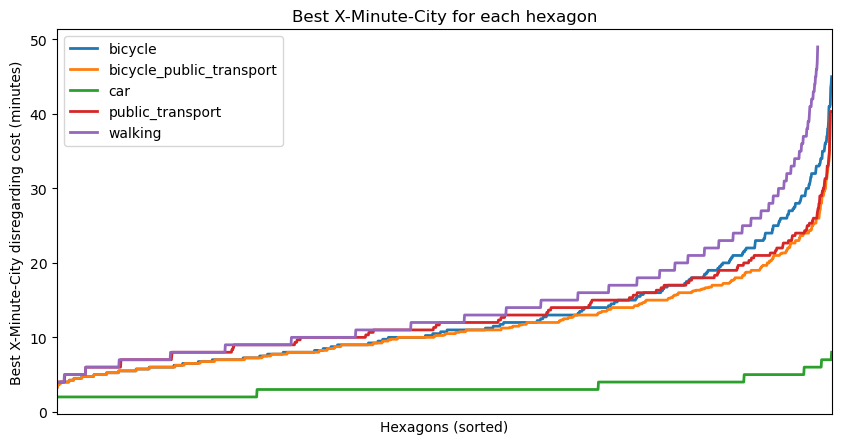

In [30]:
fig, ax = plt.subplots(figsize=(10, 5))
plot_sorted_grouped_data(profiles_df, "scenario", "optimal_in_minutes", ax)
ax.set_title('Best X-Minute-City for each hexagon')
ax.set_ylabel('Best X-Minute-City disregarding cost (minutes)')
ax.set_xlabel('Hexagons (sorted)')

plt.savefig("../figures/mcr5/best_x_minute_city.png", dpi=300, bbox_inches="tight")

plt.show()

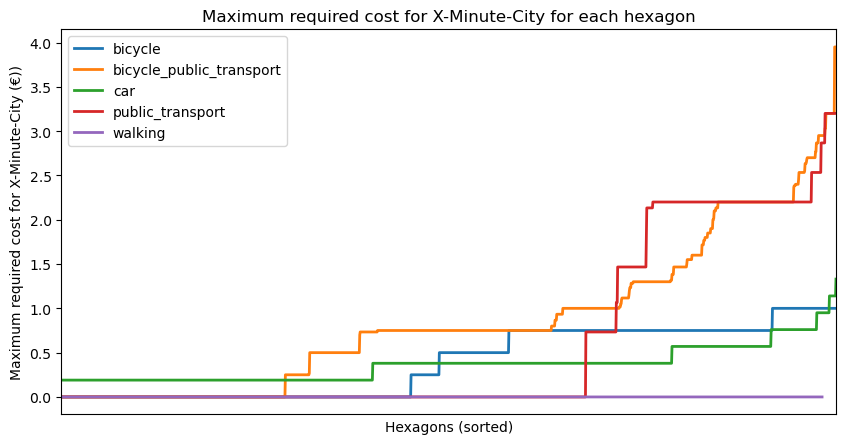

In [31]:
fig, ax = plt.subplots(figsize=(10, 5))
plot_sorted_grouped_data(
    profiles_df, "scenario", "required_cost_for_optimal_in_euro", ax
)
ax.set_title("Maximum required cost for X-Minute-City for each hexagon")
ax.set_ylabel("Maximum required cost for X-Minute-City (€))")
ax.set_xlabel("Hexagons (sorted)")

plt.savefig(
    "../figures/mcr5/maximum_required_cost_for_x_minute_city.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()


### Differences in subscenarios

In [53]:
import matplotlib.pyplot as plt


def plot_difference_in_subscenario(scenario_df, scenario_title):
    fig, ax = plt.subplots(figsize=(10, 5))
    scenario_df.groupby("hex_id")["optimal_in_minutes"].min().sort_values().plot(ax=ax)
    scenario_df.groupby("hex_id")["optimal_in_minutes"].max().sort_values().plot(ax=ax)

    ax.set_title(f"{scenario_title}: Best and worst case")
    ax.set_ylabel("Time (minutes)")
    ax.set_xlabel("Hexagons (sorted)")

    ax.set_xlim(
        0, len(scenario_df.groupby("hex_id")["optimal_in_minutes"].min().sort_values())
    )
    ax.axhline(15, color="red", linestyle="--")
    ax.set_xticks([])

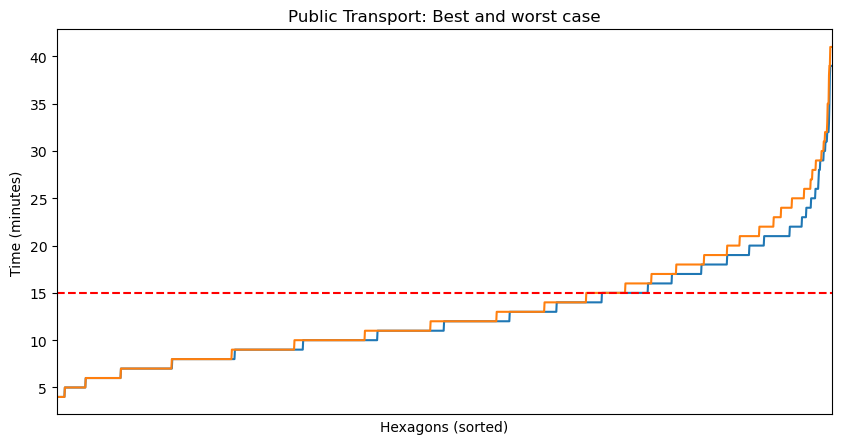

In [54]:
public_transport_profiles_df = profiles_df_unaggregated[
    profiles_df_unaggregated["core_scenario"] == "public_transport"
]
plot_difference_in_subscenario(public_transport_profiles_df, "Public Transport")

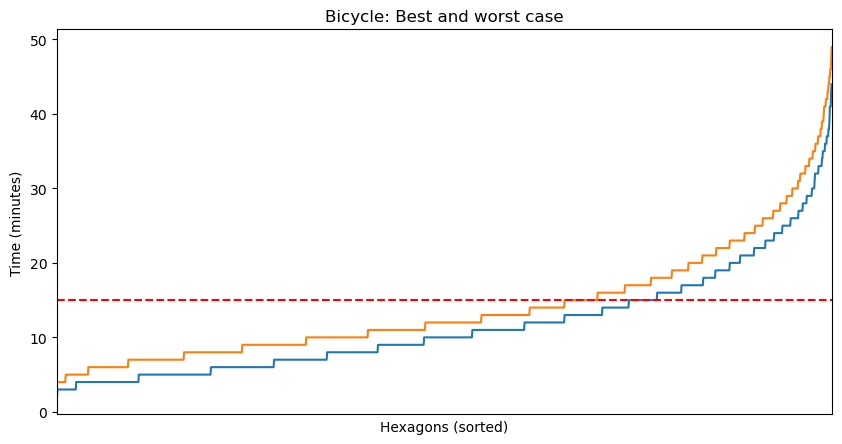

In [55]:
bicycle_profiles_df = profiles_df_unaggregated[
    profiles_df_unaggregated["core_scenario"] == "bicycle"
]
plot_difference_in_subscenario(bicycle_profiles_df, "Bicycle")

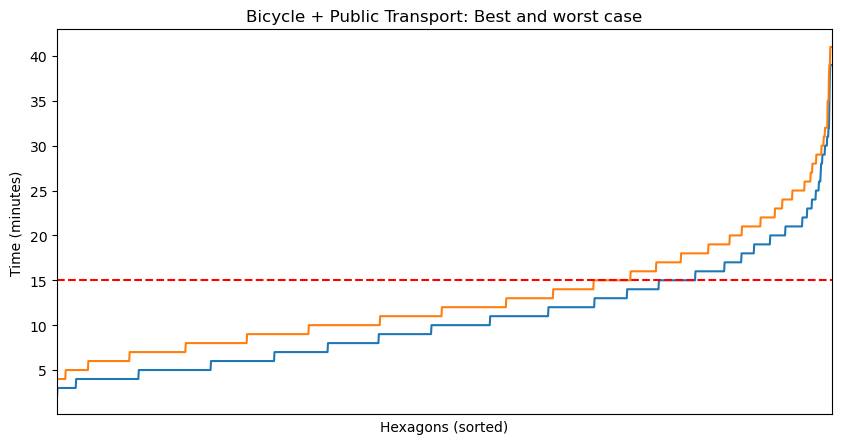

In [57]:
bicycle_pt_profiles_df = profiles_df_unaggregated[
    profiles_df_unaggregated["core_scenario"] == "bicycle_public_transport"
]
plot_difference_in_subscenario(bicycle_pt_profiles_df, "Bicycle + Public Transport")

### Value-Cost profiles for each scenario

In [65]:
import numpy as np
no_inf_profiles_df = profiles_df[np.isinf(profiles_df[cost_columns]).sum(axis=1) == 0]


In [66]:
def get_aggregated_cost_per_scenario(profiles_df, cost_columns, aggregation_metric):
    aggregated_per_cost_per_scenario = profiles_df.groupby("scenario")[
        cost_columns
    ].agg(aggregation_metric)
    aggregated_per_cost_per_scenario.columns = [
        int(column.split("_")[1]) for column in aggregated_per_cost_per_scenario.columns
    ]
    aggregated_per_cost_per_scenario = aggregated_per_cost_per_scenario.T

    maximum_time = aggregated_per_cost_per_scenario.max(numeric_only=True).max()

    return aggregated_per_cost_per_scenario, maximum_time

In [67]:
mean_per_cost_per_scenario, maximum_time = get_aggregated_cost_per_scenario(
    no_inf_profiles_df, cost_columns, "mean"
)

In [68]:
import seaborn as sns

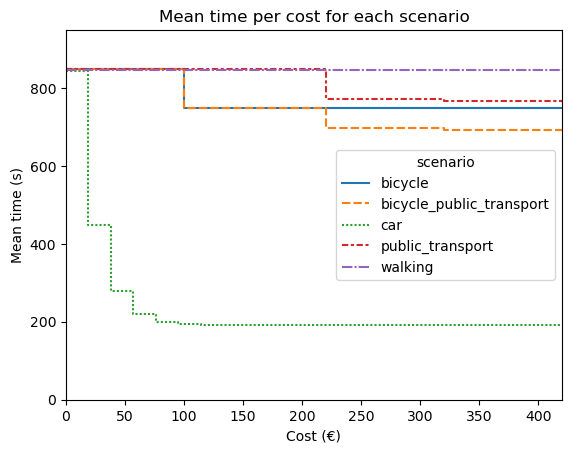

In [69]:
ax = sns.lineplot(data=mean_per_cost_per_scenario, drawstyle="steps-post")
ax.set_xlim(0, mean_per_cost_per_scenario.index.max())
ax.set_ylim(0,maximum_time+100)
ax.set_title("Mean time per cost for each scenario")
ax.set_ylabel("Mean time (s)")
ax.set_xlabel("Cost (€)")

plt.savefig(
	"../figures/mcr5/mean_time_per_cost_for_each_scenario.png",
	dpi=300,
	bbox_inches="tight",
)

plt.show()

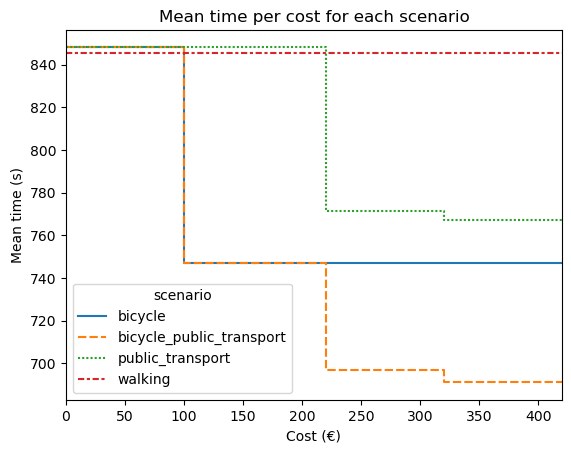

In [70]:
ax = sns.lineplot(data=mean_per_cost_per_scenario.drop(columns="car"), drawstyle="steps-post")
ax.set_xlim(0, mean_per_cost_per_scenario.index.max())
ax.set_title("Mean time per cost for each scenario")
ax.set_ylabel("Mean time (s)")
ax.set_xlabel("Cost (€)")


plt.savefig(
	"../figures/mcr5/mean_time_per_cost_for_each_scenario_without_car.png",
	dpi=300,
	bbox_inches="tight",
)

plt.show()

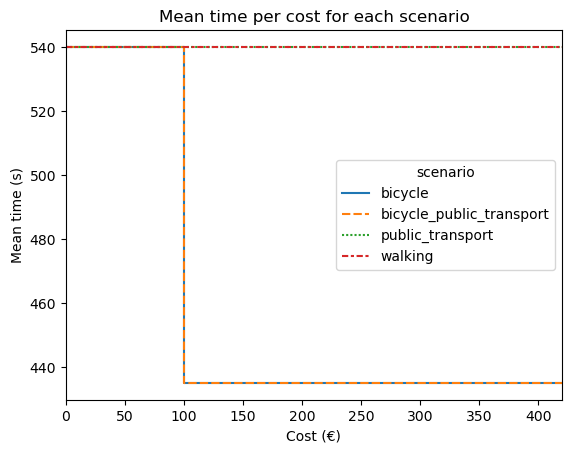

In [71]:
quantile_25_per_cost_per_scenario, maximum_time = get_aggregated_cost_per_scenario(
    no_inf_profiles_df, cost_columns, lambda x: x.quantile(0.25)
)
ax = sns.lineplot(
    data=quantile_25_per_cost_per_scenario.drop(columns="car"), drawstyle="steps-post"
)
ax.set_xlim(0, mean_per_cost_per_scenario.index.max())
ax.set_title("Mean time per cost for each scenario")
ax.set_ylabel("Mean time (s)")
ax.set_xlabel("Cost (€)")


plt.savefig(
	"../figures/mcr5/quantile_25_time_per_cost_for_each_scenario_without_car.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

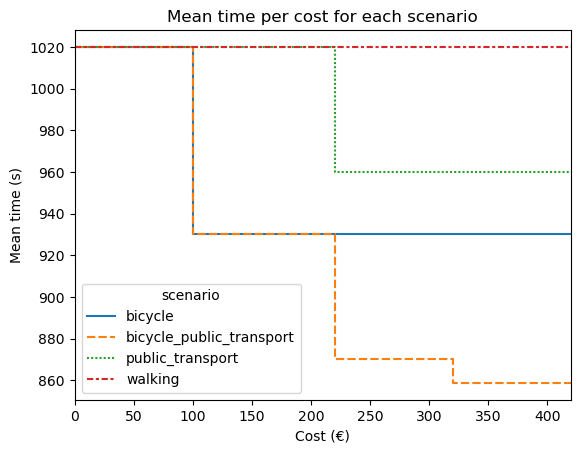

In [72]:
quantile_75_per_cost_per_scenario, maximum_time = get_aggregated_cost_per_scenario(
    no_inf_profiles_df, cost_columns, lambda x: x.quantile(0.75)
)
ax = sns.lineplot(
    data=quantile_75_per_cost_per_scenario.drop(columns="car"), drawstyle="steps-post"
)
ax.set_xlim(0, mean_per_cost_per_scenario.index.max())
ax.set_title("Mean time per cost for each scenario")
ax.set_ylabel("Mean time (s)")
ax.set_xlabel("Cost (€)")


plt.savefig(
	"../figures/mcr5/quantile_75_time_per_cost_for_each_scenario_without_car.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()

### Plotting optimal on map

only for bicycle

In [73]:
m = folium.Map(location=geo_meta.get_center_lat_lon(), zoom_start=12)
geo_meta.add_to_folium_map(m)
plot_h3_cells_on_folium(
    profiles_df.groupby(level=0)["optimal"].mean().to_dict(),
    m,
    color="red",
    popup_callback=lambda x: strtime.seconds_to_str_time(int(x)),
)
m

In [75]:
# m = folium.Map(location=geo_meta.get_center_lat_lon(), zoom_start=12)
# geo_meta.add_to_folium_map(m)
# plot_h3_cells_on_folium(
#     profiles_df[profiles_df["scenario"] == "bicycle"]["optimal"].to_dict(),
#     m,
#     color="red",
#     popup_callback=lambda x: strtime.seconds_to_str_time(int(x)),
# )
# m

### Walking not best

In [76]:
profiles_optimal = profiles_df[["optimal", "scenario"]].pivot(columns="scenario")
profiles_optimal.columns = [
    "_".join(col).strip() if isinstance(col, tuple) else col
    for col in profiles_optimal.columns.values
]
profiles_optimal = profiles_optimal.drop(columns="optimal_car")
profiles_optimal["overall_optimal"] = profiles_optimal.min(axis=1)

walking_best = profiles_optimal[
    profiles_optimal["overall_optimal"] == profiles_optimal["optimal_walking"]
]
walking_not_best = profiles_optimal[
    profiles_optimal["overall_optimal"] != profiles_optimal["optimal_walking"]
]

In [77]:
# m = folium.Map(location=geo_meta.get_center_lat_lon() , zoom_start=12)
# geo_meta.add_to_folium_map(m)
# plot_h3_cells_on_folium(
#     walking_not_best["overall_optimal"].to_dict(),
#     m,
#     color="red",
#     popup_callback=lambda x: strtime.seconds_to_str_time(int(x)),
# )
# plot_h3_cells_on_folium(
# 	walking_best["overall_optimal"].to_dict(),
# 	m,
# 	color="green",
# 	popup_callback=lambda x: strtime.seconds_to_str_time(int(x)),
# )
# m

### Not reachable by 15 minutes walking

In [122]:
MINUTES_15 = 15 * 60
# MINUTES_15 = 10 * 60
walking_below_15_mins = profiles_optimal[
    profiles_optimal["optimal_walking"] <= MINUTES_15
]
walking_above_15_mins = profiles_optimal[
    profiles_optimal["optimal_walking"] > MINUTES_15
]


but_only_bicycle_below_15_mins = walking_above_15_mins[
    (walking_above_15_mins["optimal_bicycle"] <= MINUTES_15)
    & (walking_above_15_mins["optimal_public_transport"] > MINUTES_15)
]
but_only_public_transport_below_15_mins = walking_above_15_mins[
    (walking_above_15_mins["optimal_public_transport"] <= MINUTES_15)
    & (walking_above_15_mins["optimal_bicycle"] > MINUTES_15)
]
but_both_below_15_mins = walking_above_15_mins[
    (walking_above_15_mins["optimal_public_transport"] <= MINUTES_15)
    & (walking_above_15_mins["optimal_bicycle"] <= MINUTES_15)
]
but_only_bicycle_public_transport_below_15_mins = walking_above_15_mins[
    (walking_above_15_mins["optimal_public_transport"] > MINUTES_15)
    & (walking_above_15_mins["optimal_bicycle"] > MINUTES_15)
    & (walking_above_15_mins["optimal_bicycle_public_transport"] <= MINUTES_15)
]
not_reachable_below_15_mins = walking_above_15_mins[
    walking_above_15_mins["overall_optimal"] > MINUTES_15
]

In [123]:
print(
    f"""
len(walking_above_15_mins): {len(walking_above_15_mins)} ({len(walking_above_15_mins) / len(profiles_optimal) * 100:.2f}% of all hexagons)

Of those above 15 mins:
len(but_only_bicycle_below_15_mins): {len(but_only_bicycle_below_15_mins)} ({len(but_only_bicycle_below_15_mins) / len(walking_above_15_mins) * 100:.2f}%)
len(but_only_public_transport_below_15_mins): {len(but_only_public_transport_below_15_mins)} ({len(but_only_public_transport_below_15_mins) / len(walking_above_15_mins) * 100:.2f}%)
len(but_both_below_15_mins): {len(but_both_below_15_mins)} ({len(but_both_below_15_mins) / len(walking_above_15_mins) * 100:.2f}%)
len(but_only_bicycle_public_transport_below_15_mins): {len(but_only_bicycle_public_transport_below_15_mins)} ({len(but_only_bicycle_public_transport_below_15_mins) / len(walking_above_15_mins) * 100:.2f}%)
len(not_reachable_below_15_mins): {len(not_reachable_below_15_mins)} ({len(not_reachable_below_15_mins) / len(walking_above_15_mins) * 100:.2f}%)
"""
)


len(walking_above_15_mins): 1684 (94.50% of all hexagons)

Of those above 15 mins:
len(but_only_bicycle_below_15_mins): 48 (2.85%)
len(but_only_public_transport_below_15_mins): 0 (0.00%)
len(but_both_below_15_mins): 2 (0.12%)
len(but_only_bicycle_public_transport_below_15_mins): 1 (0.06%)
len(not_reachable_below_15_mins): 1633 (96.97%)



In [100]:
if not pd.concat([
	walking_below_15_mins,
	but_only_bicycle_below_15_mins,
	but_only_public_transport_below_15_mins,
	but_both_below_15_mins,
	but_only_bicycle_public_transport_below_15_mins,
	not_reachable_below_15_mins,
]).index.is_unique:
	print("something is wrong - index is not unique")
if len(walking_above_15_mins) - (
	len(but_only_bicycle_below_15_mins)
	+ len(but_only_public_transport_below_15_mins)
	+ len(but_both_below_15_mins)
	+ len(but_only_bicycle_public_transport_below_15_mins)
	+ len(not_reachable_below_15_mins)
) != 0:
	print("something is wrong - not all cases are covered")

In [101]:
m = folium.Map(location=geo_meta.get_center_lat_lon() , zoom_start=12)

# maximum = not_reachable_below_15_mins["overall_optimal"].max()
maximum = 60*20

kwargs = {
	"popup_callback": lambda x: strtime.seconds_to_str_time(int(x)),
	"folium_map": m,
	"maximum": maximum,
}

geo_meta.add_to_folium_map(m)
plot_h3_cells_on_folium(
	walking_below_15_mins["optimal_walking"].to_dict(),
	color="green",
	**kwargs
)

plot_h3_cells_on_folium(
	pd.concat([
		but_only_bicycle_below_15_mins["optimal_bicycle"],
		but_only_public_transport_below_15_mins["optimal_public_transport"],
		but_both_below_15_mins["optimal_bicycle_public_transport"],
	]).to_dict(),
	color="yellow",
	**kwargs
)
plot_h3_cells_on_folium(
	not_reachable_below_15_mins["overall_optimal"].to_dict(),
	color="red",
	**kwargs
)

m

In [102]:
import geopandas as gpd

stations = gpd.read_file(
    "../data/stations.csv", GEOM_POSSIBLE_NAMES="geometry", KEEP_GEOM_COLUMNS="NO"
)

def plot_stations(m, stations):
    for _, station in stations.iterrows():
        folium.CircleMarker(
            location=(station.geometry.y, station.geometry.x),
            popup=station["station_name"],
            radius=1,
            color="black",
        ).add_to(m)

stations

,station_name,station_terminal_type,station_type,geometry
0,KVB Hauptverwaltung,stele,0,POINT (6.90627 50.93883)
1,Rheinenergie Parkgürtel,free,0,POINT (6.93071 50.96101)
2,Uni Boulevard,stele,0,POINT (6.92935 50.92686)
3,Neusser Straße/Gürtel 1,free,16,POINT (6.95158 50.97242)
4,Maritim,character,0,POINT (6.96116 50.93549)
...,...,...,...,...
175,(H) Godorf,sign,16,POINT (6.97843 50.84752)
176,Chempark Kasino - KVB,traffic_sign,18,POINT (6.98628 51.01412)
177,(H) Refrath 1 (R),free,16,POINT (7.11724 50.95416)
178,(H) Refrath 2 (R),free,16,POINT (7.11552 50.95430)


In [93]:
from datetime import datetime

zones = gpd.read_file(
    "../data/zones.csv", GEOM_POSSIBLE_NAMES="geometry", KEEP_GEOM_COLUMNS="NO"
)
zones["valid_from"] = pd.to_datetime(zones["valid_from"])
zones["valid_till"] = pd.to_datetime(zones["valid_till"])

color_map = {
    "chargeable_return": "red",
    "free_return": "green",
}


def plot_zones(m: folium.Map, zones: gpd.GeoDataFrame, time: datetime):
    zones = zones[(zones["valid_from"] <= time) & (zones["valid_till"] >= time)]
    # zones = zones[zones["category"] == "free_return"]
    zones = zones.sort_values("category")
    print(f"plotting {len(zones)} zones")
    for _, zone in zones.iterrows():
        print(color_map[zone["category"]])
        folium.GeoJson(
            zone.geometry,
            name=zone["name"],
            style_function=lambda x: {
                "color": "black",
                "fillOpacity": 0.5,
                "fillColor": color_map[zone["category"]],
            },
        ).add_to(m)



In [94]:
from folium.plugins import HeatMap


In [95]:
from package import storage
bicycle_location_paths = [entry.path for entry in os.scandir("../data/bicycle_locations") if entry.is_file()]

bicycle_locations_dict = {}

for bicycle_location_path in bicycle_location_paths:
	bicycle_locations = storage.read_df(bicycle_location_path)
	bicycle_locations = gpd.GeoDataFrame(
		bicycle_locations,
		geometry=gpd.points_from_xy(
			bicycle_locations.lon,
			bicycle_locations.lat,
		),
	)
	bicycle_locations_dict[bicycle_location_path] = bicycle_locations

all_bicycle_locations = pd.concat(bicycle_locations_dict.values())

def plot_bicycle_locations(m: folium.Map, bicycle_locations: gpd.GeoDataFrame, as_heatmap: bool = False, color = "orange"):
	if as_heatmap:
		HeatMap(
			data=bicycle_locations[["lat", "lon"]].to_numpy().tolist(),
			radius=5,
			blur=5,
		).add_to(m)
	else:
		for _, bicycle_location in bicycle_locations.iterrows():
			folium.CircleMarker(
				location=(bicycle_location.geometry.y, bicycle_location.geometry.x),
				popup="bicycle",
				radius=3,
				weight=1,
				color="black",
				fill=True,
				fillColor=color,
				opacity=1,
				fillOpacity=1,
			).add_to(m)

In [96]:
stops = storage.read_gdf("../data/cleaned/stops.csv")

def plot_stops(m: folium.Map, stops: gpd.GeoDataFrame, color="yellow"):
	for _, stop in stops.iterrows():
		folium.CircleMarker(
			location=(stop.geometry.y, stop.geometry.x),
			popup="stop",
			radius=3,
			weight=1,
			color="black",
			fill=True,
			fillColor=color,
			fillOpacity=1,
			opacity=1,
		).add_to(m)

In [105]:
m = folium.Map(location=geo_meta.get_center_lat_lon() , zoom_start=12)

maximum = 60*20

kwargs = {
	"popup_callback": lambda x: strtime.seconds_to_str_time(int(x)),
	"folium_map": m,
	"maximum": maximum,
}

# geo_meta.add_to_folium_map(m)
plot_h3_cells_on_folium(
	but_only_bicycle_below_15_mins["optimal_bicycle"].to_dict(),
	color="orange",
	**kwargs
)

plot_h3_cells_on_folium(
	but_only_public_transport_below_15_mins["optimal_public_transport"].to_dict(),
	color="yellow",
	**kwargs
)
plot_h3_cells_on_folium(
	but_both_below_15_mins["optimal_bicycle_public_transport"].to_dict(),
	color="green",
	**kwargs
)

# plot_stations(m, stations)
# plot_zones(m, zones, datetime(2022, 8, 1, 12, 0, 0))
plot_stops(m, stops)
plot_bicycle_locations(m, all_bicycle_locations)

m

In [112]:
m = folium.Map(location=geo_meta.get_center_lat_lon() , zoom_start=12)

maximum = 60*20

kwargs = {
	"popup_callback": lambda x: strtime.seconds_to_str_time(int(x)),
	"folium_map": m,
	"maximum": maximum,
}

# geo_meta.add_to_folium_map(m)

plot_h3_cells_on_folium(
	not_reachable_below_15_mins["optimal_bicycle"].to_dict(),
	color="red",
	**kwargs
)


# plot_stations(m, stations)
# plot_zones(m, zones, datetime(2022, 8, 1, 12, 0, 0))
# plot_bicycle_locations(m, all_bicycle_locations)
plot_stops(m, stops)

m

In [111]:
m = folium.Map(location=geo_meta.get_center_lat_lon() , zoom_start=12)

maximum = 60*20

kwargs = {
	"popup_callback": lambda x: strtime.seconds_to_str_time(int(x)),
	"folium_map": m,
	"maximum": maximum,
}

# geo_meta.add_to_folium_map(m)

plot_h3_cells_on_folium(
	but_only_bicycle_public_transport_below_15_mins["optimal_bicycle_public_transport"].to_dict(),
	color="green",
	**kwargs
)

# plot_stations(m, stations)
# plot_zones(m, zones, datetime(2022, 8, 1, 12, 0, 0))
# plot_bicycle_locations(m, all_bicycle_locations)
# plot_stops(m, stops)

m